In [1]:
import scanpy as sc
import pandas as pd
from pathlib import Path
import anndata as ad
import numpy as np
import os
import scvi

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

DPI = 300
FONTSIZE = 20  # 42

sc.settings.set_figure_params(
    scanpy=True, dpi=100, transparent=True, vector_friendly=True, dpi_save=DPI
)
from matplotlib import rcParams

rcParams["pdf.fonttype"] = 42

Global seed set to 0


In [2]:
DIR2SAVE = Path("/data/BCI-CRC/nasrine/data/CRC/Primary_CRC_dataset/subpopulations/Myeloid/final/")
DIR2SAVE.mkdir(parents=True, exist_ok=True)

FIG2SAVE = DIR2SAVE.joinpath("figures/after_20mt_sam_annot_merge/")
FIG2SAVE.mkdir(parents=True, exist_ok=True)
# set the global variable: sc.settings.figdir to save all plots
sc.settings.figdir = FIG2SAVE

In [3]:
adata = sc.read_h5ad(
    DIR2SAVE.joinpath("SMC_KUL_Pelka_Che_Wu_CRC_integrated_scvi_hvg_Myeloid_final.h5ad")
)
adata.shape

(36906, 2000)

In [4]:
adata_all = sc.read_h5ad("/data/BCI-CRC/nasrine/data/CRC/Primary_CRC_dataset/final_object/20mt/SMC_KUL_Pelka_Che_Wu_pCRC_annotations.h5ad")

In [5]:
barcodes2keep = adata_all[adata_all.obs.Annotation_scVI=="Myeloid"].obs.index
len(barcodes2keep)

36905

In [6]:
# select only barcodees that are in final object (20mt sam + my TME)
adata = adata[adata.obs.index.isin(barcodes2keep)].copy()
adata.shape

(36905, 2000)

In [7]:
# broad cell types 
old_to_new = {
    "C1QC Mac": "Mac",
    "SPP1 Mac": "Mac",
    "IL1B Mac": "Mac",
    "NLRP3 Mac": "Mac",
    "PLTP LYVE1 Mac": "Mac",
    "FCGR3A Mono": "Mono",
    "FCN1 Mono": "Mono",
    "HSP Mono": "Mono",
    "Neutrophil": "Neutrophil",
    "cDC1": "DC",
    "cDC2": "DC",
    "migDC": "DC",
    "pDC": "DC",
    "Myeloid cycling": "Myeloid cycling",
    
}

adata.obs["Annotation_scVI_broad_mac_mono_dc"] = (
    adata.obs["Annotation_scVI_detailed"].map(old_to_new).astype("category")
)

In [8]:
adata.uns["Annotation_scVI_broad_mac_mono_dc_colors"] = [
    "#937F8C",
    "#E88BC4",
    "#67A9CF",
    "#FDB462",
    "#5DCFBB",
    
]

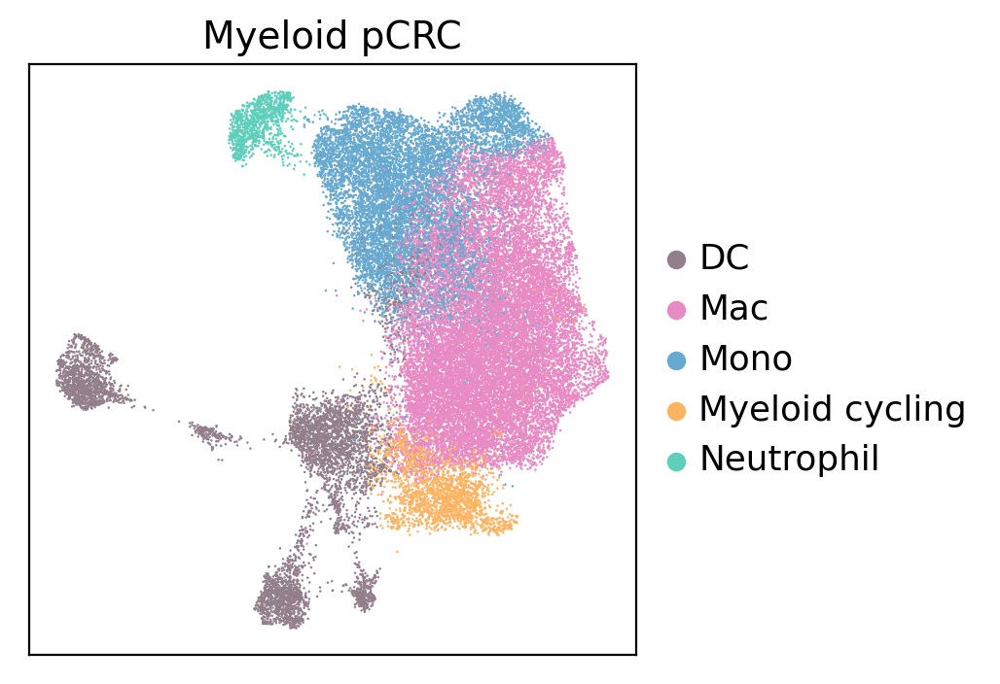

In [9]:
fig, ax = plt.subplots(nrows=1, ncols=1)
sc.pl.umap(
    adata,
    color="Annotation_scVI_broad_mac_mono_dc",
    show=False,
    legend_loc="right margin",
    title="Myeloid pCRC",
    ax=ax,
)
ax.set_xlabel("")
ax.set_ylabel("")
fig.savefig(FIG2SAVE.joinpath("AnnotationBroad.pdf"), bbox_inches='tight', dpi=DPI)

In [ ]:
sc.pl.umap(adata, color="cell_source", save="after_integration_scvi.pdf", show=True)

In [ ]:
FIG2SAVE

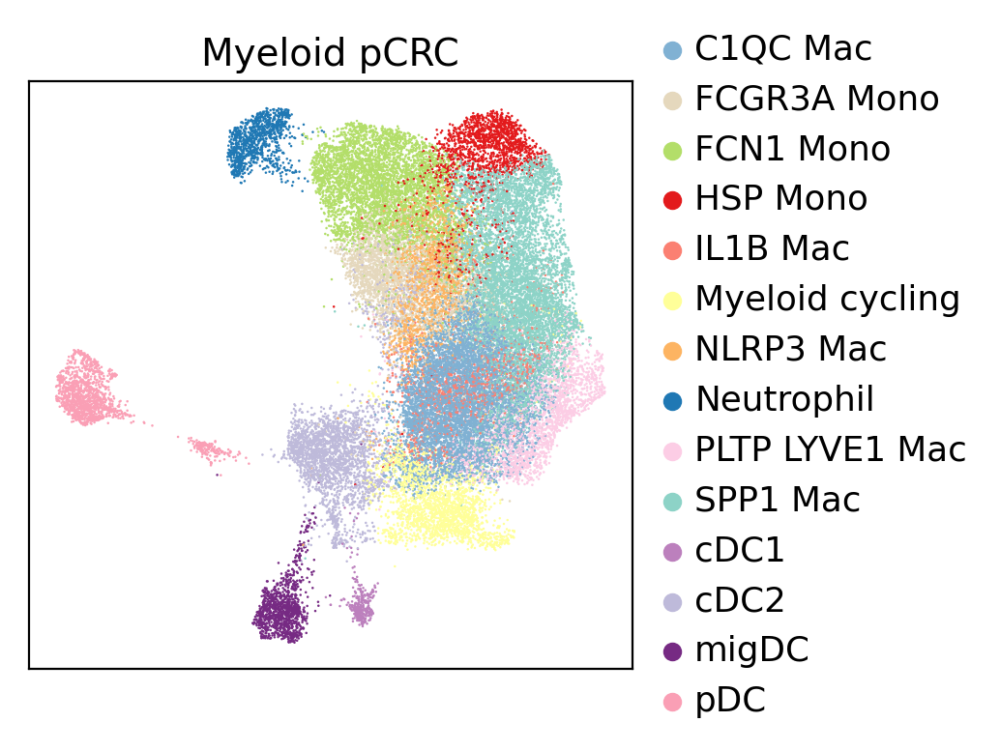

In [7]:
fig, ax = plt.subplots(nrows=1, ncols=1)
sc.pl.umap(
    adata,
    color="Annotation_scVI_detailed",
    show=False,
    legend_loc="right margin",
    title="Myeloid pCRC",
    ax=ax,
)
ax.set_xlabel("")
ax.set_ylabel("")
fig.savefig(FIG2SAVE.joinpath("Annotation.pdf"), bbox_inches='tight', dpi=DPI)

In [8]:
FIG2SAVE

PosixPath('/data/BCI-CRC/nasrine/data/CRC/Primary_CRC_dataset/subpopulations/Myeloid/final/figures/after_20mt_sam_annot_merge')

In [9]:
markers_myeloid_general = {
    "Macrophage": ["FCER1G", "CD163", "APOC1", "C1QC", "APOE"],
    "Monocyte": ["S100A8", "S100A9", "VCAN", "FCN1"],
    "DC": ["FCER1A", "PKIB", "CD1C", "PCLAF", "CLEC10A"],
    "Neutrophil": ["FCGR3B", "S100A8", "S100A12"],
    "Cycling": ["MKI67"],
}

markers_macrophage = {
    "C1QC": ["C1QC", "FPR3", "TREM2", "MS4A4A", "SLAMF8", "FCGR1A"],
    "NLRP3/IL1B": ["NLRP3", "EREG", "IL1B", "CCL3"],
    "PLTP LYVE1": ["PLTP", "LYVE1"],
    "SPP1": ["SPP1", "MARCO", "FN1", "SLC11A1", "PPARG"],
}

markers_monocyte = {
    "Monocyte": ["S100A8", "S100A9", "VCAN", "FCN1"],
    "CD14": ["CD14"],
    "CD16": ["FCGR3A"],
    "FCN1": ["FCN1"],
}

DC_markers = {
    #"DC": ["FCER1A", "PKIB", "CD1C", "PCLAF", "CLEC10A"],
    "cDC1": ["CLEC9A", "XCR1", "BATF3", "RAB7B", "CADM1"],
    "cDC2": ["CD1C", "FCER1A", "CLEC10A", "MSLN", "JAML"],
    #"DC3": ["CLEC10A", "S100A8", "CD36", "CD163"],
    "migDC": ["LAMP3", "CCR7"],
    "pDC": ["IL3RA", "LILRA4", "PLD4", "JCHAIN", "IL3RA", "SPIB", "MZB1", "IRF7"],
}

In [10]:
adata.obs.Annotation_scVI_detailed.cat.categories

Index(['C1QC Mac', 'FCGR3A Mono', 'FCN1 Mono', 'HSP Mono', 'IL1B Mac',
       'Myeloid cycling', 'NLRP3 Mac', 'Neutrophil', 'PLTP LYVE1 Mac',
       'SPP1 Mac', 'cDC1', 'cDC2', 'migDC', 'pDC'],
      dtype='object')

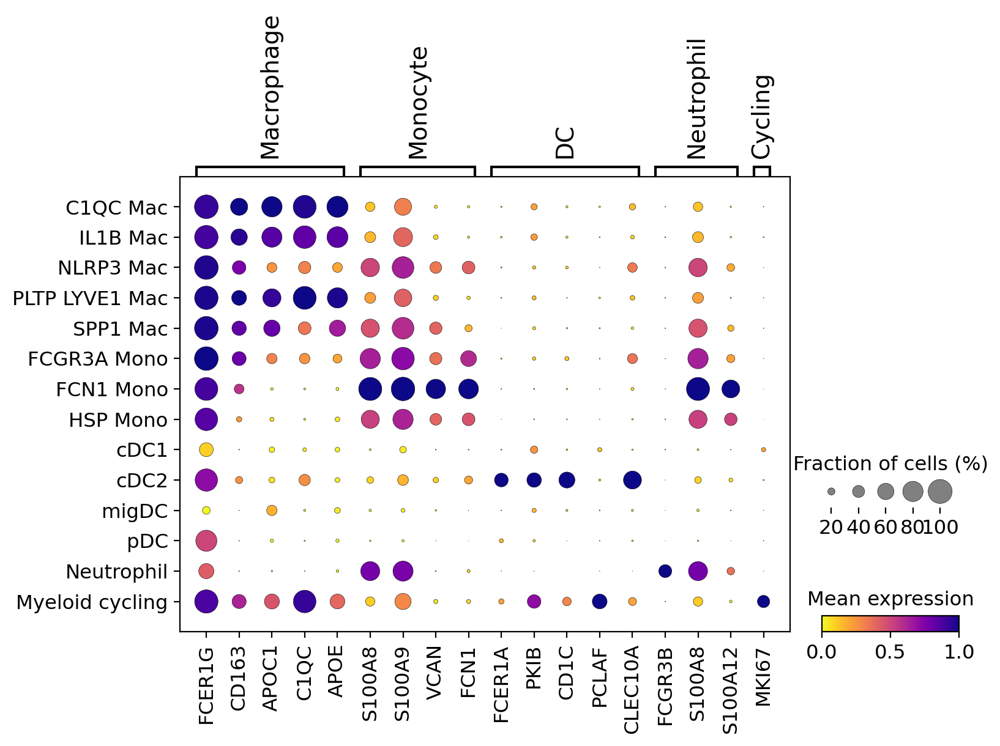

In [11]:
sc.pl.dotplot(
    adata,
    groupby="Annotation_scVI_detailed",
    use_raw=True,
    var_names=markers_myeloid_general,
    categories_order=["C1QC Mac", "IL1B Mac", "NLRP3 Mac", "PLTP LYVE1 Mac", "SPP1 Mac",
                      'FCGR3A Mono', 'FCN1 Mono', 'HSP Mono',
                      'cDC1', 'cDC2', 'migDC', 'pDC', 
                      'Neutrophil',
                      'Myeloid cycling'
                     ],
    cmap="plasma_r",
    standard_scale="var",
    vmin=0,
    vmax=1,
    colorbar_title="Mean expression",
    size_title = "Fraction of cells (%)",
    dendrogram=False,
    save="dotplot_mean_general.pdf",
    show=True,
)

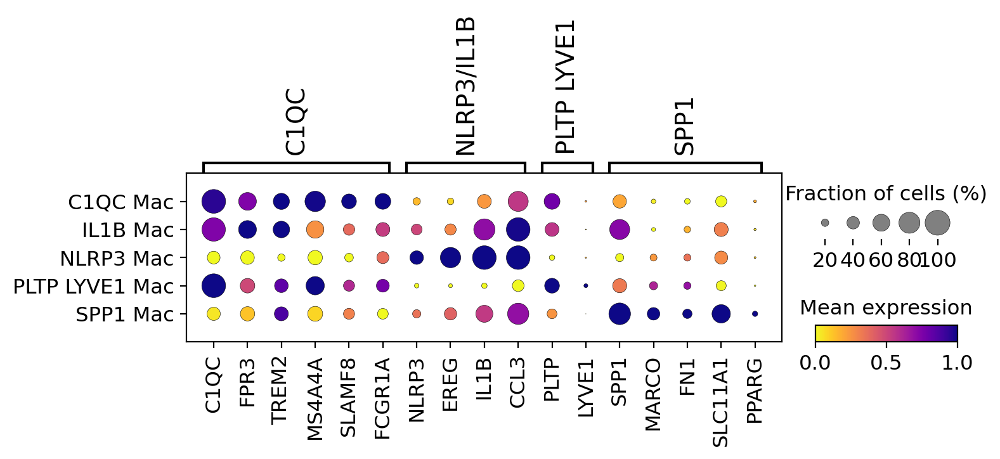

In [12]:
sc.pl.dotplot(
    adata[adata.obs.Annotation_scVI_detailed.str.contains("Mac")],
    groupby="Annotation_scVI_detailed",
    use_raw=True,
    var_names=markers_macrophage,
    cmap="plasma_r",
    standard_scale="var",
    vmin=0,
    vmax=1,
    colorbar_title="Mean expression",
    size_title = "Fraction of cells (%)",
    dendrogram=False,
    save="dotplot_mean_mac.pdf",
    show=True,
)

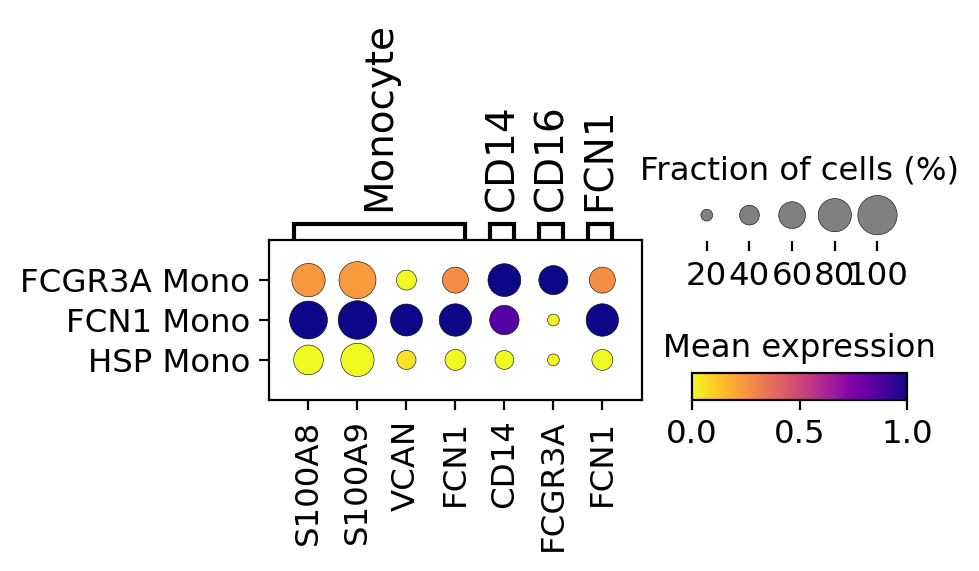

In [13]:
sc.pl.dotplot(
    adata[adata.obs.Annotation_scVI_detailed.str.contains("Mono")],
    groupby="Annotation_scVI_detailed",
    use_raw=True,
    var_names=markers_monocyte,
    cmap="plasma_r",
    standard_scale="var",
    vmin=0,
    vmax=1,
    colorbar_title="Mean expression",
    size_title = "Fraction of cells (%)",
    dendrogram=False,
    save="dotplot_mean_mono.pdf",
    show=True,
)

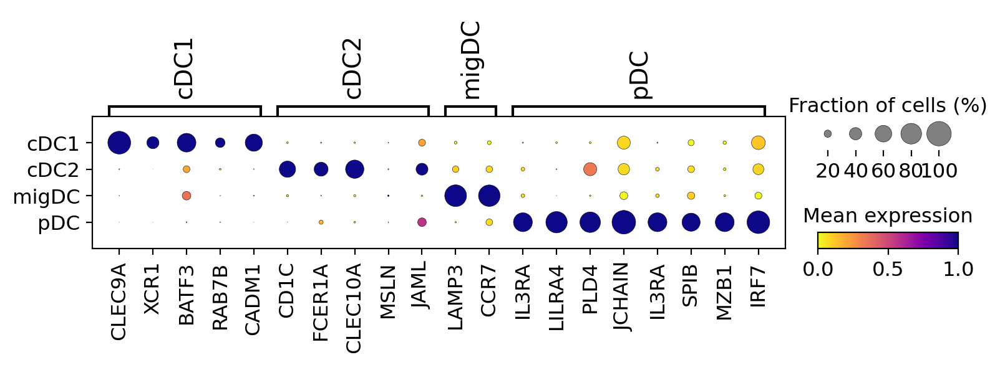

In [14]:
sc.pl.dotplot(
    adata[adata.obs.Annotation_scVI_detailed.str.contains("DC")],
    groupby="Annotation_scVI_detailed",
    use_raw=True,
    var_names=DC_markers,
    cmap="plasma_r",
    standard_scale="var",
    vmin=0,
    vmax=1,
    colorbar_title="Mean expression",
    size_title = "Fraction of cells (%)",
    dendrogram=False,
    save="dotplot_mean_DC.pdf",
    show=True,
)

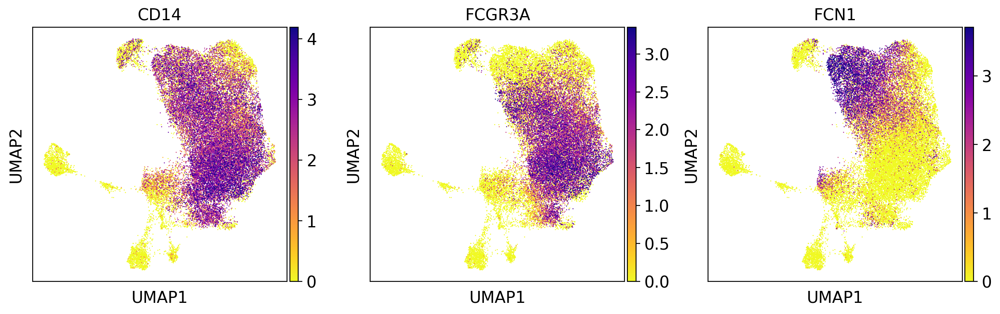

In [15]:
sc.pl.umap(
    adata,
    color=["CD14", "FCGR3A", "FCN1"],
    use_raw=True,
    vmin=0.0,
    vmax="p99",
    color_map="plasma_r",  #'RdPu',
    save="monocyte_markers.pdf",
    show=True,
)

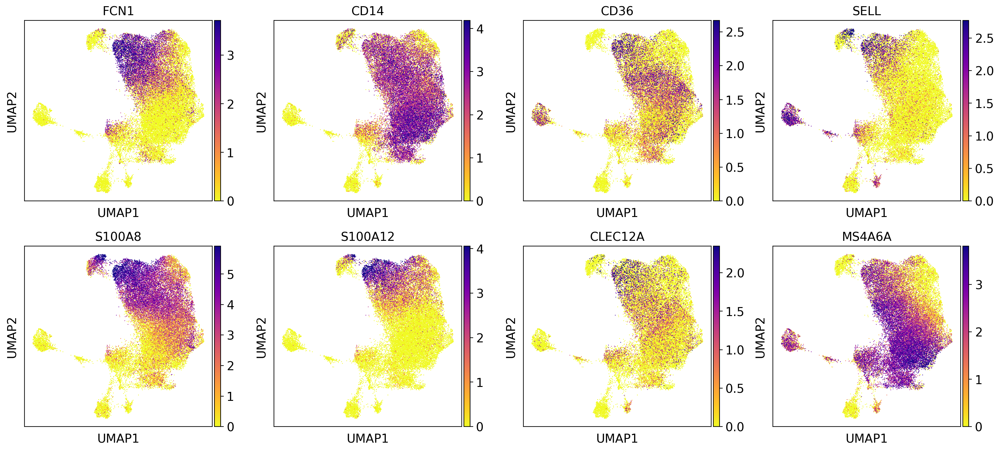

In [16]:
sc.pl.umap(
    adata,
    color=["FCN1", "CD14", "CD36", "SELL", "S100A8", "S100A12", "CLEC12A", "MS4A6A", ],
    use_raw=True,
    vmin=0.0,
    vmax="p99",
    color_map="plasma_r",  #'RdPu',
    save="monocyte_markers_cd14.pdf",
    show=True,
)

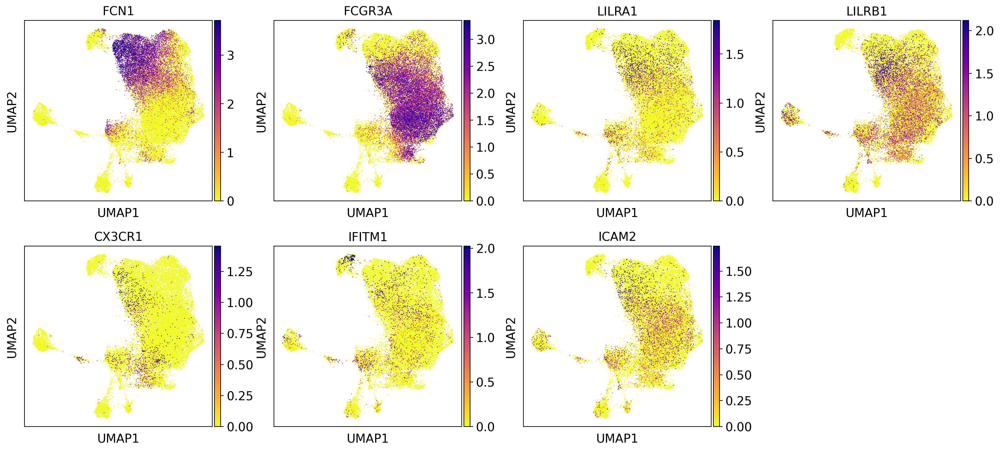

In [17]:
sc.pl.umap(
    adata,
    color=["FCN1", "FCGR3A", "LILRA1", "LILRB1", "CX3CR1", "IFITM1", "ICAM2"],
    use_raw=True,
    vmin=0.0,
    vmax="p99",
    color_map="plasma_r",  #'RdPu',
    save="monocyte_markers_cd16.pdf",
    show=True,
)

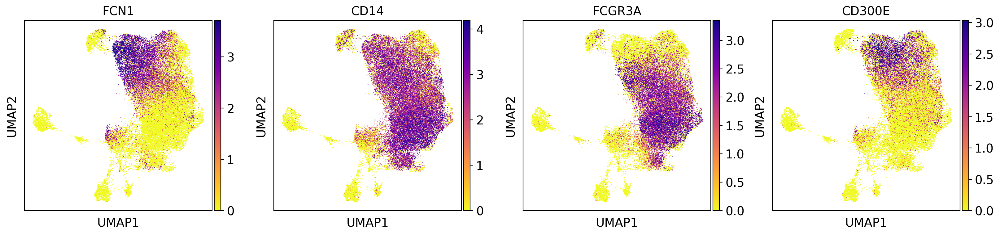

In [18]:
sc.pl.umap(
    adata,
    color=["FCN1", "CD14", "FCGR3A", "CD300E"],
    use_raw=True,
    vmin=0.0,
    vmax="p99",
    color_map="plasma_r",  #'RdPu',
    save="monocyte_markers_cd1416.pdf",
    show=True,
)

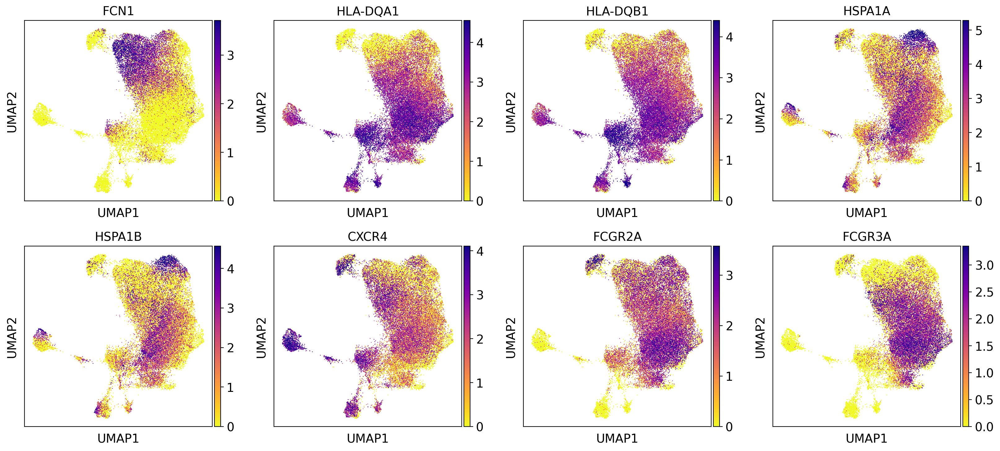

In [19]:
sc.pl.umap(
    adata,
    color=["FCN1", "HLA-DQA1", "HLA-DQB1", "HSPA1A", "HSPA1B", "CXCR4", "FCGR2A", "FCGR3A"],
    use_raw=True,
    vmin=0.0,
    vmax="p99",
    color_map="plasma_r",  #'RdPu',
    save="monocyte_markers_FCN1.pdf",
    show=True,
)

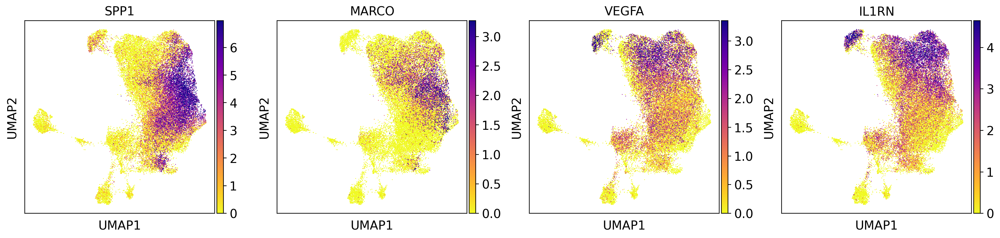

In [20]:
sc.pl.umap(
    adata,
    color=["SPP1", "MARCO", "VEGFA", "IL1RN"],
    use_raw=True,
    vmin=0.0,
    vmax="p99",
    color_map="plasma_r",  #'RdPu',
    save="SPP1_markers.pdf",
    show=True,
)

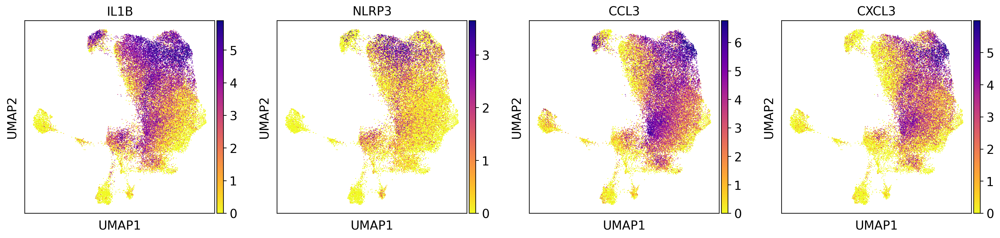

In [22]:
sc.pl.umap(
    adata,
    color=["IL1B", "NLRP3", "CCL3", "CXCL3"],
    use_raw=True,
    vmin=0.0,
    vmax="p99.7",
    color_map="plasma_r",  #'RdPu',
    save="IL1B_markers.pdf",
    show=True,
)

LA-DQA1, HLA-DQB1, HSPA1A, HSPA1B, CXCR4, FCGR2A, FCGR3A

### Score for gene signatures - Score myeloid cells for some pathways/signatures 

* look at singatures M1/M2 from zhang paper 2020 p.30/47

     * M1, "classically activated": CCL5, CCR7, CD40, CD86, CXCL9, CXCL10, CXCL11, IDO1, IL1A, IL1B, IL6, IRF1, IRF5 and KYNU
     * M2, "alternatively activated": CCL4, CCL13, CCL18, CCL20, CCL22, CD276, CLEC7A, CTSA, CTSB, CTSC, CTSD, FN1, IL4R, IRF4, LYVE1, MMP9, MMP14, MMP19, MSR1, TGFB1, TGFB2, TGFB3, TNFSF8, TNFSF12, VEGFA, VEGFB and VEGFC


* proliferation phenotypes proliferation score (Whitfield et al., 2006) from zhang paper 2020 p30/47

        AURKA, BUB1, CCNB1, CCND1, CCNE1, DEK, E2F1, FEN1, FOXM1, H2AFZ, HMGB2, MCM2, MCM3, MCM4, MCM5, MCM6, MKI67, MYBL2, PCNA, PLK1, TOP2A, TYMS and ZWINT

* look at macrophage phenotype signatures from spatiotemporal crc cancer discovery scores see 21598290cd210316-sup-261988_2_supp_7311950_qxkcf0.xlsx in downloads


* zhang 2022 paper Immune phenotypic linkage between colorectal cancer and liver metastasis gives markers for clustering for immune cells 


In [ ]:
# Zhang 2022 paper macrophage phenotype
# read excel file from Immune phenotypic linkage between colorectal cancer and liver metastasis
macro_phen_zhang = pd.read_excel(
    "/data/BCI-CRC/nasrine/data/zhang_signatures.xlsx",
    sheet_name="Macrophage_markers",
    skiprows=None,
    header=0,
    dtype=str,
)

SPP1_signature = macro_phen_zhang[
    macro_phen_zhang["Cluster"].str.contains("c54_Mph-SPP1")
]["Gene"].values.tolist()
print(len(SPP1_signature))
SPP1_signature_var = [
    gene for gene in SPP1_signature if gene in adata.raw.to_adata().var_names
]
sc.tl.score_genes(
    adata, gene_list=SPP1_signature_var, score_name="SPP1_score", use_raw=True
)
sc.pl.umap(
    adata,
    color="SPP1_score",
    vmax="p99",
    use_raw=True,
    vmin=0.5,
    save="myeloid_SPP1_score.pdf",
    color_map="YlGnBu",
    show=True,
)
print("length of gene list in adata.var:", len(SPP1_signature_var))

In [ ]:
# macrophage phenotype
# read excel file
macro_phen = pd.read_excel(
    "/data/BCI-CRC/nasrine/data/Macrophage_signature_spatiotemporal_Wu_Yingcheng_cancer_discovery_2022.xlsx",
    sheet_name="Sheet1",
    skiprows=0,
    header=1,
    dtype=str,
)
# need to set row 'Name' as index to get the process names as keys and then transpose to use fct to_dict()
# drop column 'Source'
macro_phen_dict = (
    macro_phen.set_index("Name").T.drop(labels="Source", axis=0).to_dict(orient="list")
)

print(len(macro_phen_dict["Antigen processing and presentation"]))
antigen_macro = [
    x for x in macro_phen_dict["Antigen processing and presentation"] if str(x) != "nan"
]
print(len(antigen_macro))
antigen_macro_var = [
    gene for gene in antigen_macro if gene in adata.raw.to_adata().var_names
]
sc.tl.score_genes(
    adata, gene_list=antigen_macro_var, score_name="antigen_pres_score", use_raw=True
)
sc.pl.umap(
    adata,
    color="antigen_pres_score",
    vmax="p99",
    use_raw=True,
    vmin=0.5,
    save="antigen_pres_score.pdf",
    show=True,
    color_map="YlGnBu",
)
print("length of gene list in adata.var:", len(antigen_macro_var))

angiogen_macro = [x for x in macro_phen_dict["Angiogenesis"] if str(x) != "nan"]
print(len(angiogen_macro))
angiogen_macro_var = [
    gene for gene in angiogen_macro if gene in adata.raw.to_adata().var_names
]
sc.tl.score_genes(
    adata, gene_list=angiogen_macro_var, score_name="angiogenesis_score", use_raw=True
)
sc.pl.umap(
    adata,
    color="angiogenesis_score",
    vmax="p99",
    use_raw=True,
    vmin=0.2,
    save="angiogenesis_score.pdf",
    show=True,
    color_map="YlGnBu",
)
print("length of gene list in adata.var:", len(angiogen_macro_var))

suppress_macro = [x for x in macro_phen_dict["Immune suppression"] if str(x) != "nan"]
print(len(suppress_macro))
suppress_macro_var = [
    gene for gene in suppress_macro if gene in adata.raw.to_adata().var_names
]
sc.tl.score_genes(
    adata,
    gene_list=suppress_macro_var,
    score_name="immunosuppression_score",
    use_raw=True,
)
sc.pl.umap(
    adata,
    color="immunosuppression_score",
    vmax="p99",
    use_raw=True,
    vmin=0.2,
    save="immunosuppression_score.pdf",
    show=True,
    color_map="YlGnBu",
)
print("length of gene list in adata.var:", len(suppress_macro_var))

complement_macro = [x for x in macro_phen_dict["Complement"] if str(x) != "nan"]
print(len(complement_macro))
complement_macro_var = [
    gene for gene in complement_macro if gene in adata.raw.to_adata().var_names
]
sc.tl.score_genes(
    adata, gene_list=complement_macro_var, score_name="complement_score", use_raw=True
)
sc.pl.umap(
    adata,
    color="complement_score",
    vmax="p99",
    use_raw=True,
    vmin=0.2,
    save="complement_score.pdf",
    show=True,
    color_map="YlGnBu",
)
print("length of gene list in adata.var:", len(complement_macro_var))

print(len(macro_phen_dict["Inflammation"]))
inflamm_macro = [x for x in macro_phen_dict["Inflammation"] if str(x) != "nan"]
print(len(inflamm_macro))
inflamm_macro_var = [
    gene for gene in inflamm_macro if gene in adata.raw.to_adata().var_names
]
sc.tl.score_genes(
    adata, gene_list=inflamm_macro_var, score_name="inflammation_score", use_raw=True
)
sc.pl.umap(
    adata,
    color="inflammation_score",
    vmax="p99",
    use_raw=True,
    vmin=0.2,
    save="inflammation_score.pdf",
    show=True,
    color_map="YlGnBu",
)
print("length of gene list in adata.var:", len(inflamm_macro_var))

### from paper : Macrophage diversity in cancer revisited in the era of single-cell omics
look at different macrophage gene signature to identify TAM subsets

In [ ]:
markers_tams = {
    #"IFN-TAMs": ["CXCL10", "CD274", "ISG15", "CD86", "CCL2", "IFIT1", "IFIT2", "IFIT3", "IFITM1"], 
    "Inflam-TAMs": ["IL1B", "CXCL2", "CXCL3", "CXCL8", "CCL3", "CCL3L1", "CCL2", "IL1RN"],
    "Angio-TAMs": ["VEGFA", "SPP1", "VCAN", "TIMP1", "FN1", "PPARG", "FCN1", "THBS1", "AREG", "CD163"],
    "LA-TAMs": ["APOC1", "APOE", "ACP5", "FABP5", "C1QA", "C1QB", "C1QC", "TREM2", "CSTB", "SPP1"],
    #"RTM-TAMs": ["LYVE1", "HES1", "FOLR2", "CD5L", "C1QA", "C1QB", "C1QC"]
}
# Prolif-TAMs: ["CDK1", "HMGN2", "MKI67", "STMN1", "TOP2A", "TUBB"]

### Plot all in 1

In [ ]:
markers_all = {
    "Neutrophil": ["FCGR3B", "S100A8", "S100A12"],
    "Macrophage": ["FCER1G", "CD163", "APOC1", "APOE"], # "C1QC"
    "C1QC": ["C1QC", "FPR3", "TREM2", "MS4A4A", "SLAMF8", "FCGR1A"],
    "NLRP3/IL1B": ["NLRP3", "EREG", "IL1B", "CCL3"],
    "PLTP LYVE1": ["PLTP", "LYVE1"],
    "SPP1": ["SPP1", "MARCO", "FN1", "SLC11A1", "PPARG"],
    "Monocyte": ["S100A8", "S100A9", "VCAN", "FCN1"],
    "CD14": ["CD14"],
    "CD16": ["FCGR3A"],
    "FCN1": ["FCN1"],
    #"DC": ["FCER1A", "PKIB", "CD1C", "PCLAF", "CLEC10A"],
    "cDC1": ["CLEC9A", "XCR1", "BATF3", "RAB7B", "CADM1"],
    "cDC2": ["CD1C", "FCER1A", "CLEC10A"],
    #"DC3": ["CLEC10A", "S100A8", "CD36", "CD163"],
    "migDC": ["LAMP3", "CCR7"],
    "pDC": ["IL3RA", "LILRA4", "JCHAIN", "SPIB", "MZB1", "IRF7"],
    "Cycling": ["MKI67"],
}

In [ ]:
sc.pl.dotplot(
    adata,
    groupby="Annotation_scVI_detailed",
    categories_order=[
        "Neutrophil",
        "C1QC Mac",
        "PLTP LYVE1 Mac",
        "NLRP3 Mac",
        "IL1B Mac",
        "SPP1 Mac",
        "FCGR3A Mono",
        "FCN1 Mono",
        "HSP Mono",
        "cDC1",
        "cDC2",
        "migDC",
        "pDC",
        "Myeloid cycling"   
    ],
    use_raw=True,
    var_names=markers_all,
    cmap="plasma_r",
    standard_scale="var",
    vmin=0,
    vmax=1,
    colorbar_title="Mean expression",
    size_title="Fraction of cells (%)",
    dendrogram=False,
    save="dotplot_mean_all.pdf",
    show=True,
)

### zscore

In [12]:
adata_zscore = adata.raw.to_adata().copy()
# scale and store results in layer for later plotting
adata_zscore.layers['scaled'] = sc.pp.scale(adata_zscore, copy=True).X
adata_zscore.obs=adata.obs

In [ ]:
sc.pl.dotplot(adata=adata_zscore, 
              var_names=markers_all,
              categories_order=[
        "Neutrophil",
        "C1QC Mac",
        "PLTP LYVE1 Mac",
        "NLRP3 Mac",
        "IL1B Mac",
        "SPP1 Mac",
        "FCGR3A Mono",
        "FCN1 Mono",
        "HSP Mono",
        "cDC1",
        "cDC2",
        "migDC",
        "pDC",
        "Myeloid cycling"   
    ],
              groupby="Annotation_scVI_detailed",
              cmap="seismic", 
              layer="scaled", 
              vmin=-2,
              vmax=2, 
              dot_max=0.5, 
              colorbar_title = "scaled expression", 
              size_title="Fraction of cells (%)",
              save='zscore_general.pdf')

In [ ]:
sc.pl.dotplot(
    adata_zscore[adata_zscore.obs.Annotation_scVI_detailed.str.contains("Mac")],
    groupby="Annotation_scVI_detailed",
    var_names=markers_macrophage,
    categories_order=["C1QC Mac", "IL1B Mac", "NLRP3 Mac", "PLTP LYVE1 Mac", "SPP1 Mac"],
    cmap="seismic", 
    layer="scaled", 
    vmin=-2,
    vmax=2,
    colorbar_title="scaled expression",
    size_title = "Fraction of cells (%)",
    dot_max=0.3, 
    dendrogram=False,
    save="dotplot_mean_mac_zscore.pdf",
    show=True,
)

In [ ]:
sc.pl.dotplot(
    adata_zscore[adata_zscore.obs.Annotation_scVI_detailed.str.contains("DC")],
    groupby="Annotation_scVI_detailed",
    var_names=DC_markers,
    cmap="seismic", 
    layer="scaled", 
    vmin=-2,
    vmax=2,
    colorbar_title="scaled expression",
    size_title = "Fraction of cells (%)",
    dendrogram=False,
    save="dotplot_mean_DC_zscore.pdf",
    show=True,
)

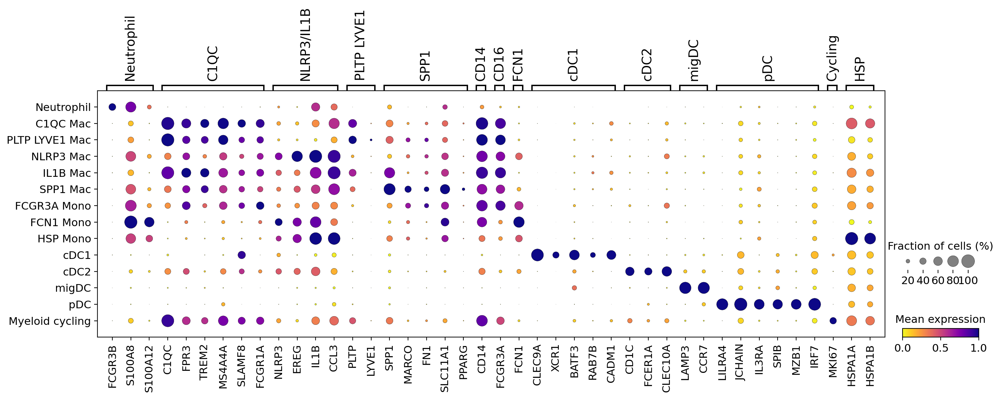

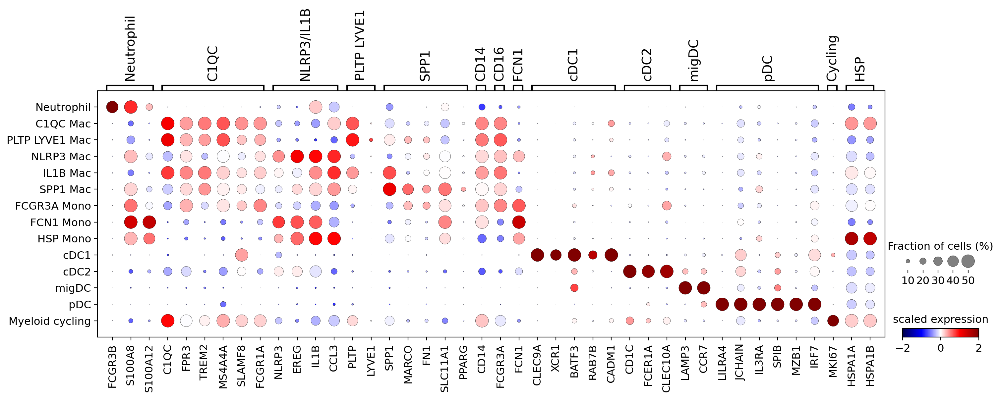

In [22]:
## don't put macorphage and mono
markers_no_monomac = {
    "Neutrophil": ["FCGR3B", "S100A8", "S100A12"],
    #"Macrophage": ["FCER1G", "CD163", "APOC1", "APOE"], # "C1QC"
    "C1QC": ["C1QC", "FPR3", "TREM2", "MS4A4A", "SLAMF8", "FCGR1A"],
    "NLRP3/IL1B": ["NLRP3", "EREG", "IL1B", "CCL3"],
    "PLTP LYVE1": ["PLTP", "LYVE1"],
    "SPP1": ["SPP1", "MARCO", "FN1", "SLC11A1", "PPARG"],
    #"Monocyte": ["S100A8", "S100A9", "VCAN", "FCN1"],
    "CD14": ["CD14"],
    "CD16": ["FCGR3A"],
    "FCN1": ["FCN1"],
    #"DC": ["FCER1A", "PKIB", "CD1C", "PCLAF", "CLEC10A"],
    "cDC1": ["CLEC9A", "XCR1", "BATF3", "RAB7B", "CADM1"],
    "cDC2": ["CD1C", "FCER1A", "CLEC10A"],
    #"DC3": ["CLEC10A", "S100A8", "CD36", "CD163"],
    "migDC": ["LAMP3", "CCR7"],
    "pDC": ["LILRA4","JCHAIN", "IL3RA", "SPIB", "MZB1", "IRF7"],
    "Cycling": ["MKI67"],
    "HSP": ['HSPA1A', 'HSPA1B']
}

sc.pl.dotplot(
    adata,
    groupby="Annotation_scVI_detailed",
    categories_order=[
        "Neutrophil",
        "C1QC Mac",
        "PLTP LYVE1 Mac",
        "NLRP3 Mac",
        "IL1B Mac",
        "SPP1 Mac",
        "FCGR3A Mono",
        "FCN1 Mono",
        "HSP Mono",
        "cDC1",
        "cDC2",
        "migDC",
        "pDC",
        "Myeloid cycling"   
    ],
    use_raw=True,
    var_names=markers_no_monomac,
    cmap="plasma_r",
    standard_scale="var",
    vmin=0,
    vmax=1,
    colorbar_title="Mean expression",
    size_title="Fraction of cells (%)",
    dendrogram=False,
    save="dotplot_mean_all_no_mono_mac.pdf",
    show=True,
)

sc.pl.dotplot(adata=adata_zscore, 
              var_names=markers_no_monomac,
              categories_order=[
        "Neutrophil",
        "C1QC Mac",
        "PLTP LYVE1 Mac",
        "NLRP3 Mac",
        "IL1B Mac",
        "SPP1 Mac",
        "FCGR3A Mono",
        "FCN1 Mono",
        "HSP Mono",
        "cDC1",
        "cDC2",
        "migDC",
        "pDC",
        "Myeloid cycling"   
    ],
              groupby="Annotation_scVI_detailed",
              cmap="seismic", 
              layer="scaled", 
              vmin=-2,
              vmax=2, 
              dot_max=0.5, 
              colorbar_title = "scaled expression", 
              size_title="Fraction of cells (%)",
              save='zscore_general_no_mono_mac.pdf')

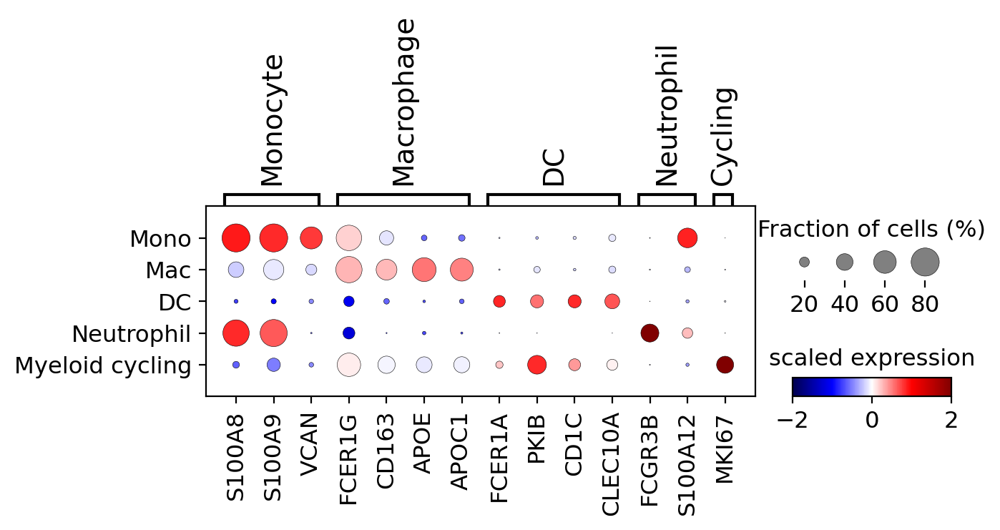

In [18]:
broad_markers_dict = {
    "Monocyte": ['S100A8', 'S100A9', 'VCAN'],
    "Macrophage": ['FCER1G', 'CD163', 'APOE', 'APOC1'],
    "DC": ["FCER1A", "PKIB", "CD1C", "CLEC10A"],
    "Neutrophil": ["FCGR3B", "S100A12"],
    'Cycling': ['MKI67'],
}


sc.pl.dotplot(adata=adata_zscore, 
              var_names=broad_markers_dict,
              categories_order=[
                  "Mono",
                  "Mac",
                  "DC",
                  "Neutrophil",
                  "Myeloid cycling"
    ],
              groupby="Annotation_scVI_broad_mac_mono_dc",
              cmap="seismic", 
              layer="scaled", 
              vmin=-2,
              vmax=2, 
              dot_max=0.8, 
              colorbar_title = "scaled expression", 
              size_title="Fraction of cells (%)",
              save='zscore_general_broadmarkers.pdf')

MARCO, TREM2, and CD36 in lipid-laden TAM

ovascularization as tumors outgrow and hypoxic areas arise.49 Cancer cells in lowly oxygenated hypoxic pockets generate a CXC chemokine gradient (e.g., CXCL7, CXCL12, and CXCL16) to attract macrophages

rthogonally, TAMs promote tumor angiogenesis by stimulating the degradation of the perivascular ECM via secretion of MMP2, 9, 13, and 14 and other proteases

https://www.sciencedirect.com/science/article/pii/S0092867423001630

Highly express Trem2, GPNMB AND LIPID PROGRAMS. Yofe, Shani et al cancer discovery 2023

from Macrophage diversity in cancer revisited in the era of single-cell omics: 
- APOE and FABP5 in CRC
- LA-TAMs have the expression signature of lipid-related genes, including APOC1, APOE, ACP5, and FABP5, and a distinctive enrichment of lipid metabolism and oxidative phosphorylation pathways [

### Lipid laden tams

In [ ]:
# rom Macrophage diversity in cancer revisited in the era of single-cell omics: 
tam_ith = {
    "Lipid-laden" : ["TREM2", "ACP5", "APOE", "APOC1", "GPNMB", "FABP5", "CD36", "MARCO",
                     "LIPA", "CTSB", "LGALS3",
                   "MMP9", "MRC1", "SPP1"],
    "Angio": ["SPP1", "VCAN", "TIMP1", "VEGFA",  "BNIP3", "CD44", "CLEC5A", "CTSB", 
              "FLT1", "FN1","IL1RN", "PPARG", ],
    "Inflam": ["CCL3", "CCL3L1", "CCL4L2", "CXCL2", "CXCL3", "CXCL8", "IL1B"],
    "IFN-TAMs": ["CXCL10", "CD274", "ISG15", "CD86", "CCL2", "IFIT1", "IFIT2", "IFIT3", "IFITM1"], 
    "RTM": ["CD5L", "VSIG4", "LYVE1", "HES1", "FOLR2"],
}


sc.pl.dotplot(
    adata_zscore[adata_zscore.obs.Annotation_scVI_detailed.str.contains("Mac|Kupffer")].copy(),
    groupby="Annotation_scVI_detailed",
    use_raw=False,
    var_names=tam_ith,
    cmap="seismic", 
    layer="scaled",
    vmin=-2,
    vmax=2,
    dot_max=0.5, 
    colorbar_title="scaled expression",
    size_title = "Fraction of cells (%)",
    dendrogram=False,
    save="Mac_dotplot_TAMSsubset_signatures.pdf",
    show=True,
)

### compute gene scores of these signatures and then show it in violin plots

In [ ]:
adata_tams = adata[
    adata.obs.Annotation_scVI_detailed.str.contains("Mac|Kupffer")
].copy()

# compute scores
for k in tam_ith.keys():
    sc.tl.score_genes(
    adata_tams, gene_list=tam_ith[k], score_name=f"{k}_score", use_raw=True)

In [ ]:
sc.pl.umap(
    adata_tams,
    color="Angio_score",
    vmax="p99.7",
    use_raw=True,
    vmin=0.2,
    show=True,
    color_map="YlGnBu",
)

In [ ]:
tam_ith.keys()

In [ ]:
sns.set_style("white")
sns.set_theme(style="ticks")

xticklabels = list(adata_tams.obs.Annotation_scVI_detailed.cat.categories)
palette = ["#80b1d3", "#fb8072", "#fdb462", "#fccde5", "#8dd3c7"]

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(16,3), gridspec_kw={'wspace':0.3})
ax1 = sns.violinplot(data=adata_tams.obs, x="Annotation_scVI_detailed", 
                     y="Lipid-laden_score", ax=ax1, palette=palette)
ax2 = sns.violinplot(data=adata_tams.obs, x="Annotation_scVI_detailed", 
                     y="Angio_score", ax=ax2, palette=palette)
ax3 = sns.violinplot(data=adata_tams.obs, x="Annotation_scVI_detailed", 
                     y="Inflam_score", ax=ax3, palette=palette)
ax4 = sns.violinplot(data=adata_tams.obs, x="Annotation_scVI_detailed", 
                     y="IFN-TAMs_score", ax=ax4, palette=palette)
ax5 = sns.violinplot(data=adata_tams.obs, x="Annotation_scVI_detailed", 
                     y="RTM_score", ax=ax5, palette=palette)


ax1.set_title("Lipid-laden-TAMS")
ax2.set_title("Angio-TAMs")
ax3.set_title("Inflammatory-TAMs")
ax4.set_title("IFN-TAMs")
ax5.set_title("RTM-TAMs")

ax1.set(xlabel=None)
ax1.set(ylabel="Gene signature score")

ax2.set(xlabel=None)
ax2.set(ylabel=None)
ax3.set(xlabel=None)
ax3.set(ylabel=None)
ax4.set(xlabel=None)
ax4.set(ylabel=None)
ax5.set(xlabel=None)
ax5.set(ylabel=None)
              

ax1.set_xticklabels(xticklabels, rotation = 90)
ax2.set_xticklabels(xticklabels, rotation = 90)
ax3.set_xticklabels(xticklabels, rotation = 90)
ax4.set_xticklabels(xticklabels, rotation = 90)
ax5.set_xticklabels(xticklabels, rotation = 90)

#ax1.set_ylim(bottom=-0.2)
#ax2.set_ylim(bottom=0)
#ax3.set_ylim(bottom=0)
#ax4.set_ylim(bottom=0)
#ax5.set_ylim(bottom=0)
#ax1.set_ylim([0, 2])
#ax2.set_ylim([0, 2])
#ax3.set_ylim([0, 2])
#ax4.set_ylim([0, 2])
#ax5.set_ylim([0, 2])

plt.savefig(FIG2SAVE.joinpath("Mac_signature_scores_violinplot.pdf"), 
            dpi=DPI, 
            format="pdf",
            bbox_inches="tight")

### Score for monocyttes from same paper Macrophage diversity in cancer revisited in the era of single-cell omics

In [7]:
monocyte_ith = {
    # CD14+ cd16 - 
    "Classical TIMs": ["S100A4", "S100A6", "S100A8", "S100A9", "S100A12", "S100A13", "AREG", "CCL4",
                       "CCR2", "CD14", "CD300E", "CD36", "CEBPD", "CLEC11A", "CLEC12A", 
                       "CSF1R", "CTSS", "CX3CR1", "CXCL2", "CXCR4", "EGR1", "FCN1", "FOS", "FTH1", "IL1B", 
                       "ITGAM", "JUNB", "LGALS2", "LY6C1", "LY6C2", "LYZ", "MAF", "MAFB", "MPEG1", "NFKB1",
                       "NFKBIA", "NLRP3", "NR4A1", "NR4A2", "OSM", "PTGS2", "RGS2", "SELL", "THBS1", "VCAN"],
    # CD16 +, CD14-
    "Nonclassical monocytes": ["CX3CR1", "CCL5", "CD52", "CDH23", "CDKN1C", "FCGR3A" "FCGR3B", "FCGR4", "GNLY",
                               "GZMB", "ICAM2", "IFITM1", "IL32", "KLRC4", "KLRK1", "LILRA1", "LILRB1",
                               "MS4A7", "MTSS1", "PRF1", "SLC44A2"],
    # cd 14 cd 16 ++
    "Intermediate monocytes": ["CCL2" "CCL8", "CX3CR1", "CXCL10", "FCGR3A", "IFITM2", "IL1RN", "IRF7",
                               "ISG15", "ISIG20", "LILRB1", "LILRA1", "MS4A7", "MTSS1", "RHOC", "SERPINA1",
                               "SIGLEC10", "STAT1", "TCF7L2", "TNFSF10", "TNFSF13B"]
}

In [8]:
adata_mono = adata[
    adata.obs.Annotation_scVI_detailed.str.contains("Mono")
].copy()

# compute scores
for k in monocyte_ith.keys():
    sc.tl.score_genes(
    adata_mono, gene_list=monocyte_ith[k], score_name=f"{k}_score", use_raw=True)

/data/BCI-CRC/nasrine/anaconda/envs/cell2loc19/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/data/BCI-CRC/nasrine/anaconda/envs/cell2loc19/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/data/BCI-CRC/nasrine/anaconda/envs/cell2loc19/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [9]:
list(adata_mono.obs.Annotation_scVI_detailed.cat.categories)

['FCGR3A Mono', 'FCN1 Mono', 'HSP Mono']

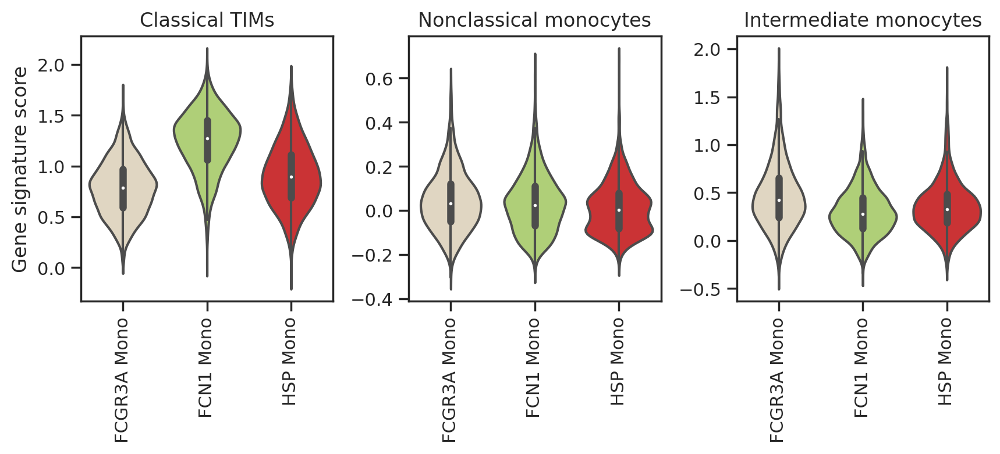

In [10]:
sns.set_style("white")
sns.set_theme(style="ticks")

xticklabels = list(adata_mono.obs.Annotation_scVI_detailed.cat.categories)
palette = ["#e5d8bd", "#b3de69", "#e31a1c"]

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,3), gridspec_kw={'wspace':0.3})
ax1 = sns.violinplot(data=adata_mono.obs, x="Annotation_scVI_detailed", 
                     y="Classical TIMs_score", ax=ax1, palette=palette)
ax2 = sns.violinplot(data=adata_mono.obs, x="Annotation_scVI_detailed", 
                     y="Nonclassical monocytes_score", ax=ax2, palette=palette)
ax3 = sns.violinplot(data=adata_mono.obs, x="Annotation_scVI_detailed", 
                     y="Intermediate monocytes_score", ax=ax3, palette=palette)

ax1.set_title('Classical TIMs')
ax2.set_title('Nonclassical monocytes')
ax3.set_title('Intermediate monocytes')

ax1.set(xlabel=None)
ax1.set(ylabel="Gene signature score")

ax2.set(xlabel=None)
ax2.set(ylabel=None)
ax3.set(xlabel=None)
ax3.set(ylabel=None)           

ax1.set_xticklabels(xticklabels, rotation = 90)
ax2.set_xticklabels(xticklabels, rotation = 90)
ax3.set_xticklabels(xticklabels, rotation = 90)

plt.savefig(FIG2SAVE.joinpath("Monocyte_signature_scores_violinplot.pdf"), 
            dpi=DPI, 
            format="pdf",
            bbox_inches="tight")

In [11]:
FIG2SAVE

PosixPath('/data/BCI-CRC/nasrine/data/CRC/Primary_CRC_dataset/subpopulations/Myeloid/final/figures/after_20mt_sam_annot_merge')

### proportions across datasetts

In [7]:
from matplotlib.patches import Rectangle


def proportion_cells_patient(
    adata, groupby_labels, xlabel: str, ylabel: str, colors: dict, figname: str, bbox_to_anchor=(1, 0.8)
):  # colors
    # compute proportion of cells within each group
    table2plot = (
        adata.reset_index()
        .groupby(groupby_labels)
        .size()
        .groupby(level=0)
        .apply(lambda x: x * 100 / x.sum())
        .unstack()
    )

    fig, ax = plt.subplots(
        nrows=1,
        ncols=1,
        sharey=False,
        sharex=False,
        dpi=DPI,
    )  # figsize=(4, 4))

    print(table2plot)
    table2plot.plot.barh(stacked=True, ax=ax, color=colors.values())  # , color=colors
    ax.set_ylabel(ylabel)
    ax.set_xlabel(xlabel)
    ax.grid(False, which="major", axis="both")  # removes major horizontal gridlinesd

    labels = list(colors.keys())
    l = [Rectangle((0, 0), 0, 0, color=color) for color in list(colors.values())]
    ax.legend(
        l,
        labels,
        loc="upper left",
        bbox_to_anchor=bbox_to_anchor, #(1, 0.8),
        facecolor="white",
        edgecolor="white",
        ncol=1,
        borderaxespad=0.0,
        framealpha=0,
        frameon=False,
    )

    plt.savefig(FIG2SAVE.joinpath(figname), dpi=DPI, format="pdf", bbox_inches="tight")
    plt.show()

cell_source                     SMC       KUL      Pelka        Che         Wu
Annotation_scVI_detailed                                                      
C1QC Mac                  12.498062  1.860754  54.582106  24.143278   6.915801
FCGR3A Mono                5.895439  2.558398  77.011494  11.197627   3.337041
FCN1 Mono                  9.178228  2.219851  68.943436  13.660619   5.997866
HSP Mono                  44.045584  0.797721  24.330484  13.789174  17.037037
IL1B Mac                  49.347975  0.754976  31.434454  13.932739   4.529856
Myeloid cycling            9.095106  0.692521  67.728532  13.804247   8.679594
NLRP3 Mac                 39.268680  1.377848  25.543190  25.861155   7.949126
Neutrophil                 5.887939  0.000000  67.046534   2.659069  24.406458
PLTP LYVE1 Mac             3.813953  8.139535  72.465116  12.465116   3.116279
SPP1 Mac                  16.003990  2.793216  59.412854  11.429386  10.360553
cDC1                       0.000000  1.749271  49.56

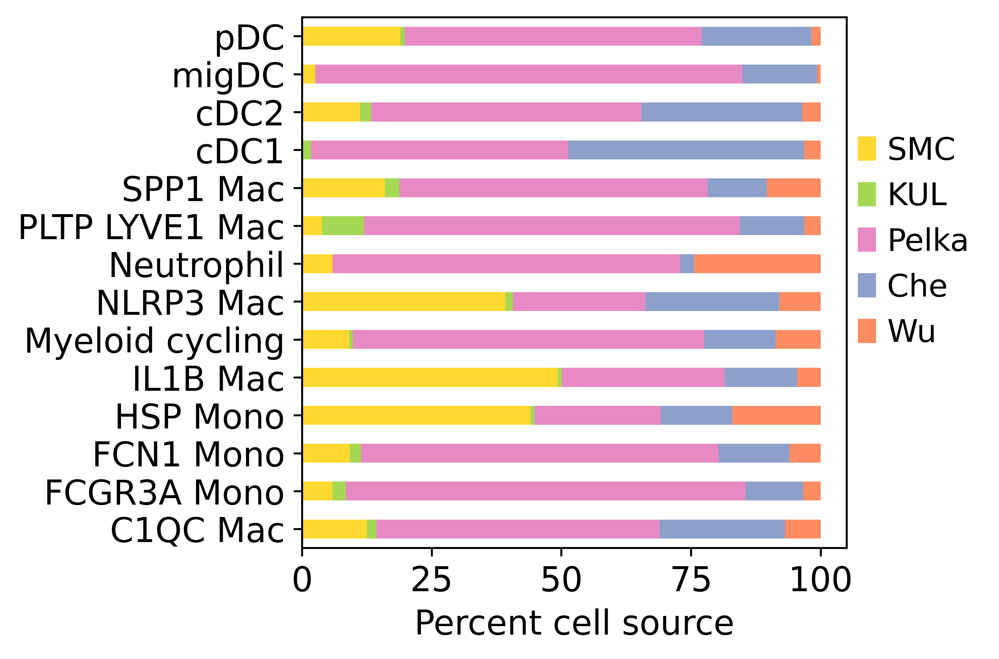

In [8]:
from collections import OrderedDict

color_dict = OrderedDict(
    zip(
        adata.obs["cell_source"].cat.categories.values.tolist(),
        adata.uns["cell_source_colors"],
    )
)

proportion_cells_patient(
    adata.obs,
    groupby_labels=["Annotation_scVI_detailed", "cell_source"],
    xlabel="Percent cell source",
    ylabel="",
    colors=color_dict,
    figname="annotation_cell_source.pdf",
)

Annotation_scVI_detailed   C1QC Mac  FCGR3A Mono  FCN1 Mono   HSP Mono  \
cell_source                                                              
SMC                       14.170183     2.795359   7.559775  13.590014   
KUL                       14.851485     8.539604  12.871287   1.732673   
Pelka                     16.432473     9.696093  15.078661   1.993371   
Che                       24.804843     4.811216  10.195953   3.855345   
Wu                        16.451494     3.319808  10.365179  11.029141   

Annotation_scVI_detailed   IL1B Mac  Myeloid cycling  NLRP3 Mac  Neutrophil  \
cell_source                                                                   
SMC                       12.640647         3.463432  13.027426    1.090014   
KUL                        1.361386         1.856436   3.217822    0.000000   
Pelka                      2.138089         6.848420   2.250128    3.295831   
Che                        3.234029         4.763422   7.774415    0.446073   
Wu     

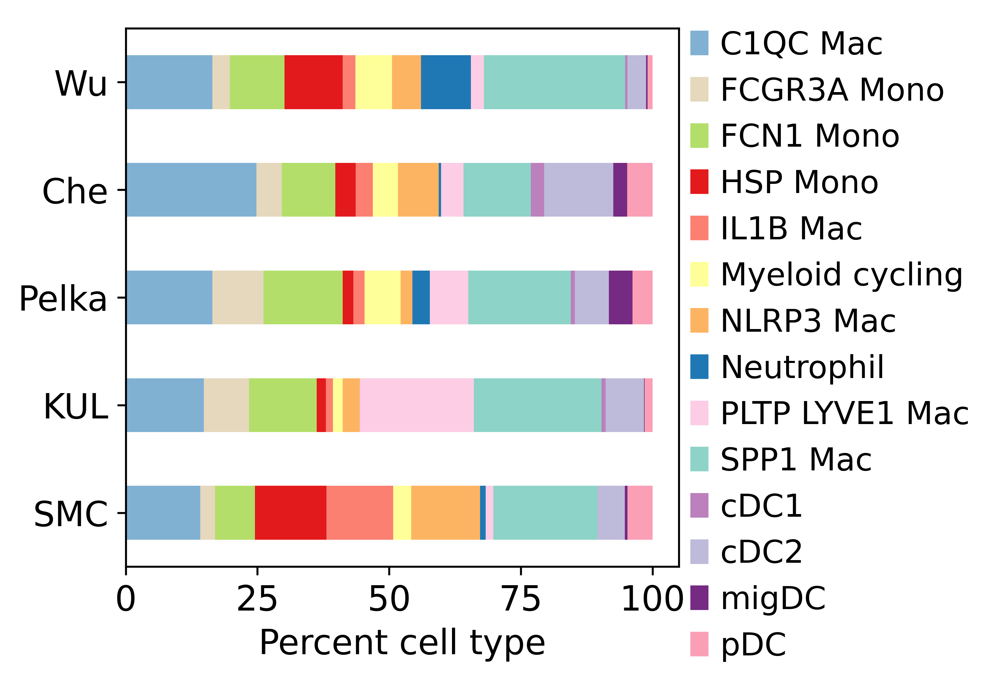

In [9]:
from collections import OrderedDict

color_dict = OrderedDict(
    zip(
        adata.obs["Annotation_scVI_detailed"].cat.categories.values.tolist(),
        adata.uns["Annotation_scVI_detailed_colors"],
    )
)

proportion_cells_patient(
    adata.obs,
    groupby_labels=["cell_source", "Annotation_scVI_detailed"],
    xlabel="Percent cell type",
    ylabel="",
    colors=color_dict,
    bbox_to_anchor=(1,1.02),
    figname="barplot_annotation_across_cell_source.pdf",
)

In [10]:
adata.obs[adata.obs.Annotation_scVI_detailed=="FCN1 Mono"].Cell_subtype.value_counts()

cM01 (Monocyte)           3187
TAM IL1B/NLRP3             577
Pro-inflammatory           492
S100A8+ Monocytes          243
cM02 (Macrophage-like)      32
                          ... 
Anti-inflammatory            0
TAM MKI67                    0
Unknown                      0
cB1 (B IGD+IgM+)             0
pDC                          0
Name: Cell_subtype, Length: 66, dtype: int64